In [94]:
import os
import sys
import math
from math import log10, sqrt
from time import time
import pandas as pd
import numpy as np
import sklearn
import matplotlib.pyplot as plt
import seaborn as sns
import cv2
import cv2 as cv
from PIL import Image as im
import warnings
from skimage.feature import greycomatrix,greycoprops
from random import randint
warnings.filterwarnings("ignore", category=DeprecationWarning) 
%matplotlib inline

In [95]:
from PIL import Image
import os, sys
def resize(path):
    for file in os.listdir(path): 
        f_img = path+"/"+file
        img = Image.open(f_img)
        img = img.resize((250, 250)) 
        img.save(f_img)

In [96]:
resize(r"C:\Users\hp\Documents\8th sem\PP1\Project Folder\Dataset\Weed")
resize(r"C:\Users\hp\Documents\8th sem\PP1\Project Folder\Dataset\Wheat")

In [97]:
train_dir = r'C:\Users\hp\Documents\8th sem\PP1\Project Folder\Dataset'
labels= ['wheat', 'weed']
test_size=0.85
for sp in labels:
    print('{} {} images'.format(sp, len(os.listdir(os.path.join(train_dir, sp)))))
train = []
for species_num, sp in enumerate(labels):
    for file in os.listdir(os.path.join(train_dir, sp)):
        train.append([r'C:\Users\hp\Documents\8th sem\PP1\Project Folder\Dataset//{}//{}'.format(sp, file), species_num, sp])
        
train = pd.DataFrame(train, columns=['file', 'species_num', 'species'])
 
print('Training Data: ',train.shape)

wheat 25 images
weed 22 images
Training Data:  (47, 3)


In [98]:
def median_filter(data, kernel_size):
    temp = []
    indexer = kernel_size // 2
    data_final = []
    data_final = np.zeros((len(data),len(data[0])))
    for i in range(len(data)):
        for j in range(len(data[0])):
            for z in range(kernel_size):
                if i + z - indexer < 0 or i + z - indexer > len(data) - 1:
                    for c in range(kernel_size):
                        temp.append(0)
                else:
                    if j + z - indexer < 0 or j + indexer > len(data[0]) - 1:
                        temp.append(0)
                    else:
                        for k in range(kernel_size):
                            temp.append(data[i + z - indexer][j + k - indexer])

            temp.sort()
            data_final[i][j] = temp[len(temp) // 2]
            temp = []
    return data_final
def rgb2gray(rgb):
    if(len(rgb.shape) == 3):
        return np.uint8(np.dot(rgb[...,:3], [0.2989, 0.5870, 0.1140]))
    else:
        return rgb

In [99]:
def ExGs(img):
    arr=img.flatten()
    for i in range(len(arr)):
        if arr[i]>=arr.mean():
            arr[i]=4
        elif arr[i]>=0.75:
            arr[i]=3
        elif arr[i]>0.5 :
            arr[i]=2
        elif arr[i]>0.25:
            arr[i]=1
        else:
            arr[i]=0
    segment=arr.reshape(img.shape[0],img.shape[1])
    kernel_laplace = np.array([np.array([1, 1, 1]), np.array([1, -8, 1]), np.array([1, 1, 1])])
    out_l = ndimage.convolve(segment, kernel_laplace, mode='reflect')
    arr=[]
    for i in out_l.flatten():
        if i == 0:
            arr.append(0)
        else:
            arr.append(-100)
    arr=np.array(arr)
    arr=arr.reshape(out_l.shape[0],out_l.shape[1])
    
    return segment
    

(250, 250, 3)


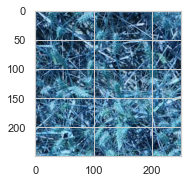

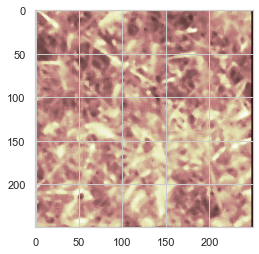

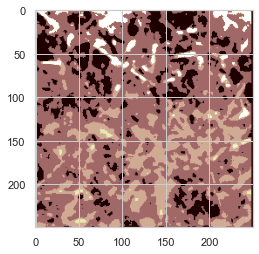

(250, 250, 3)


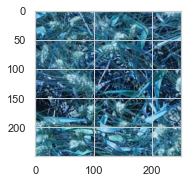

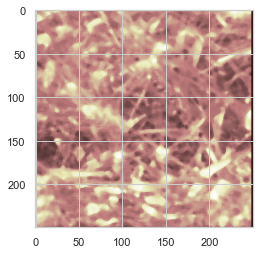

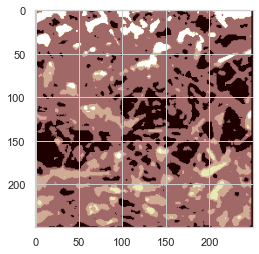

(250, 250, 3)


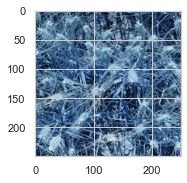

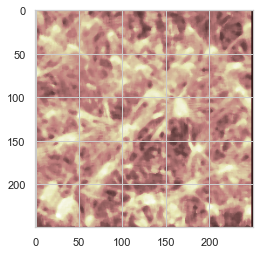

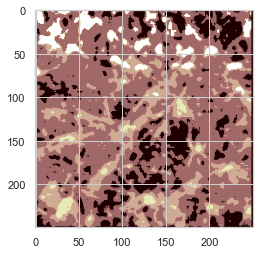

(250, 250, 3)


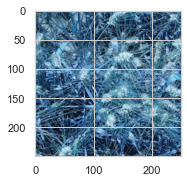

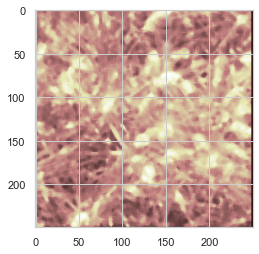

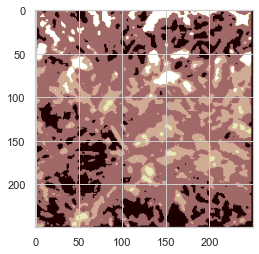

(250, 250, 3)


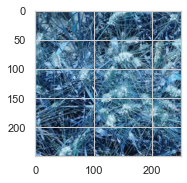

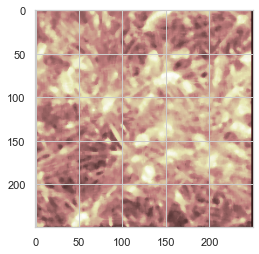

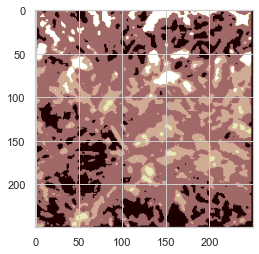

(250, 250, 3)


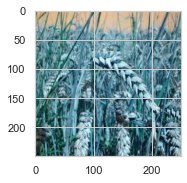

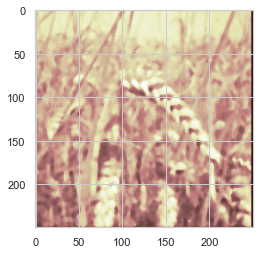

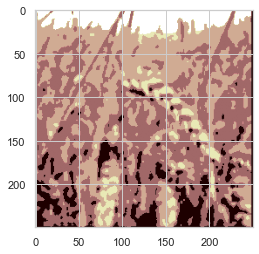

(250, 250, 3)


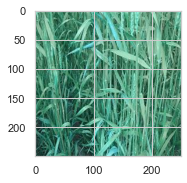

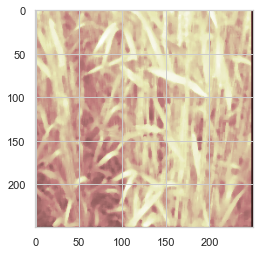

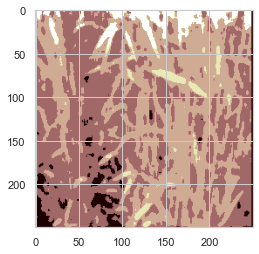

(250, 250, 3)


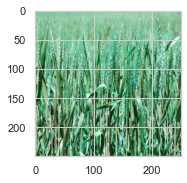

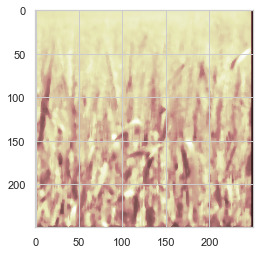

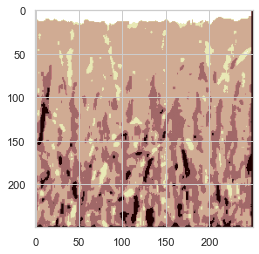

(250, 250, 3)


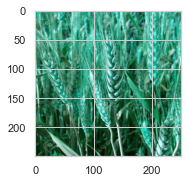

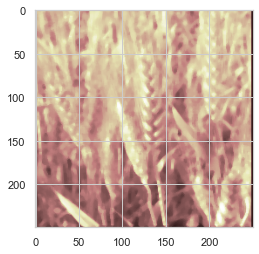

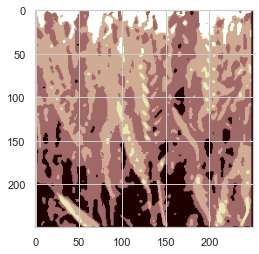

(250, 250, 3)


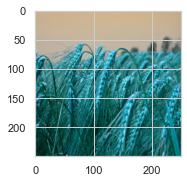

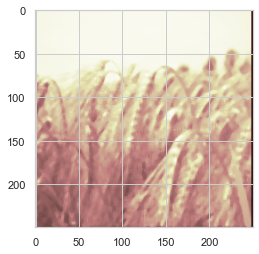

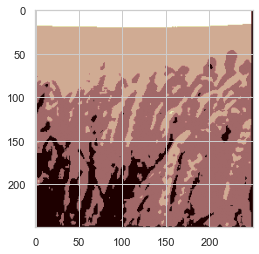

(250, 250, 3)


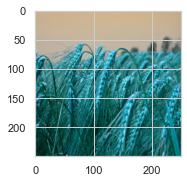

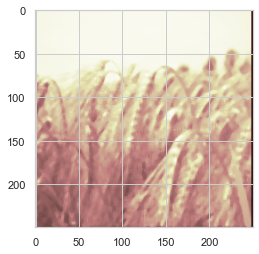

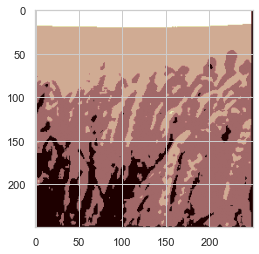

(250, 250, 3)


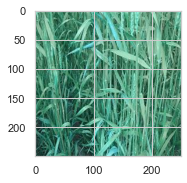

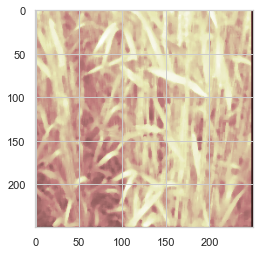

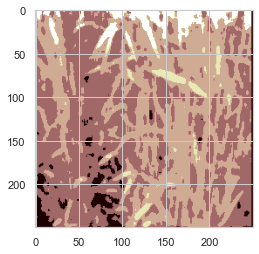

(250, 250, 3)


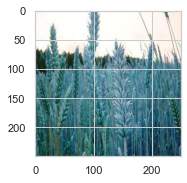

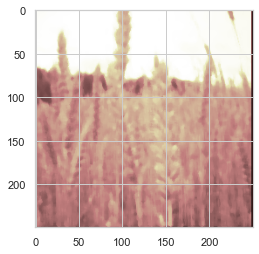

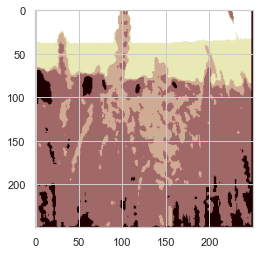

(250, 250, 3)


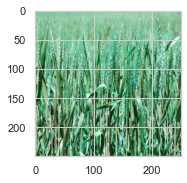

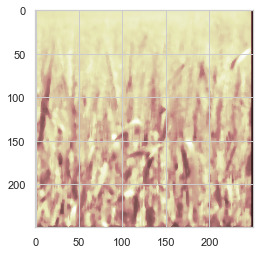

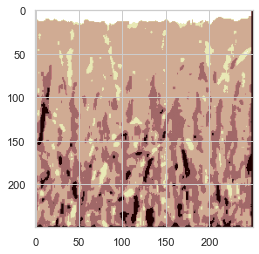

(250, 250, 3)


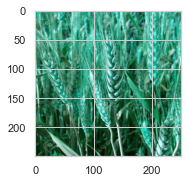

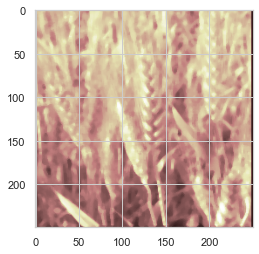

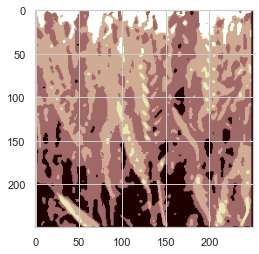

(250, 250, 3)


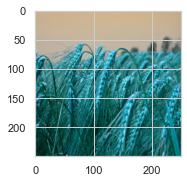

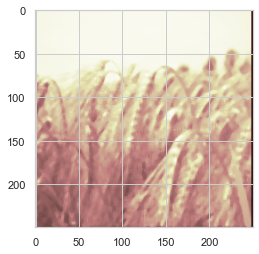

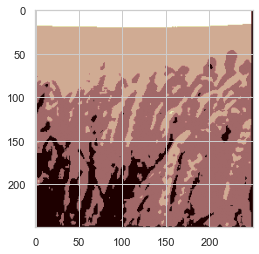

(250, 250, 3)


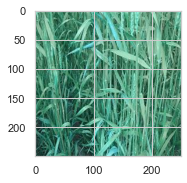

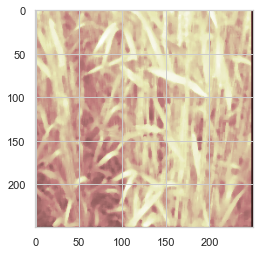

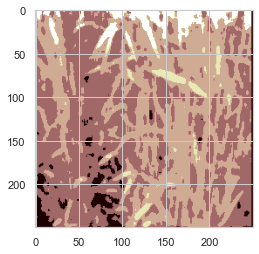

(250, 250, 3)


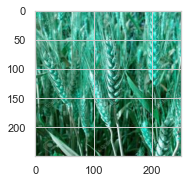

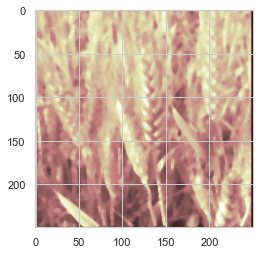

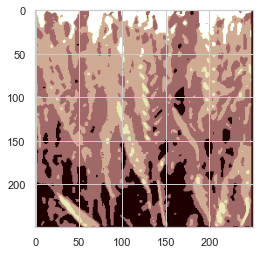

(250, 250, 3)


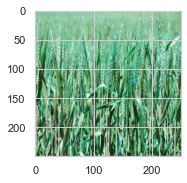

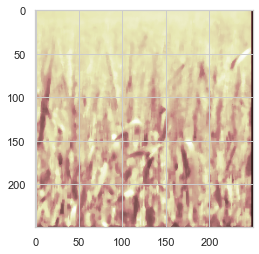

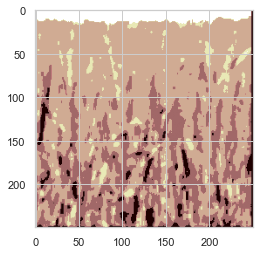

(250, 250, 3)


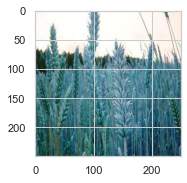

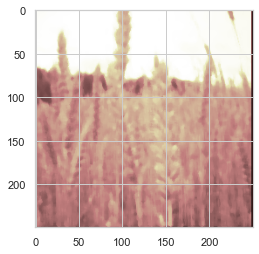

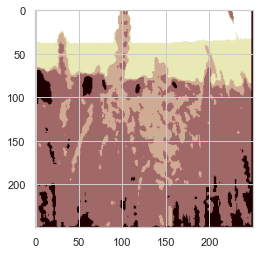

(250, 250, 3)


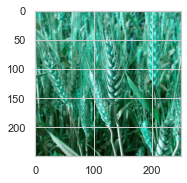

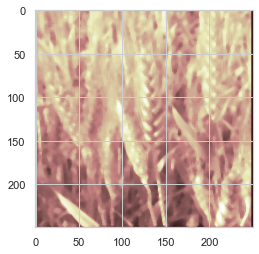

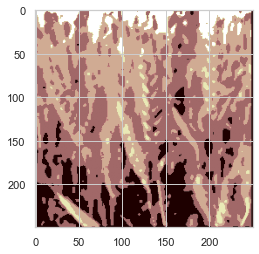

(250, 250, 3)


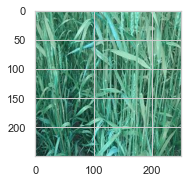

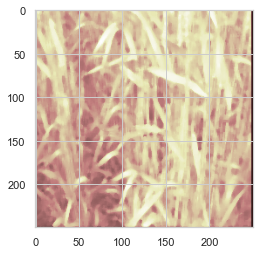

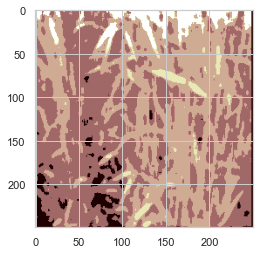

(250, 250, 3)


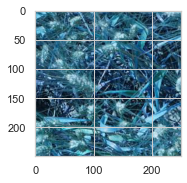

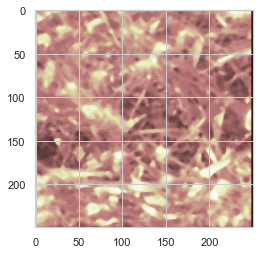

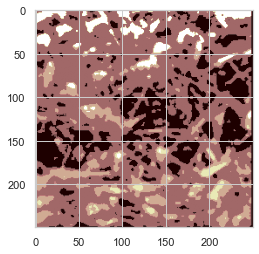

(250, 250, 3)


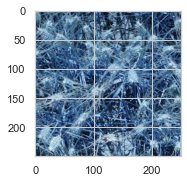

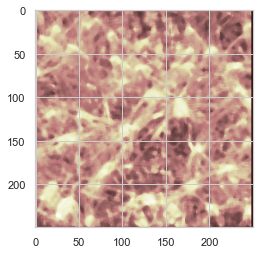

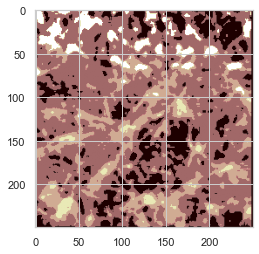

(250, 250, 3)


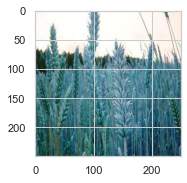

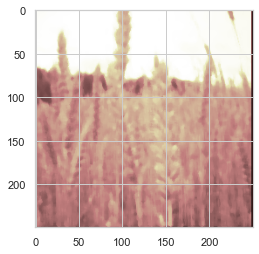

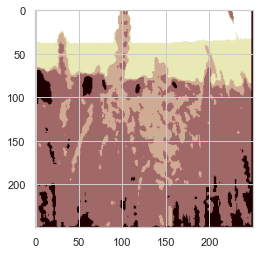

(250, 250, 3)


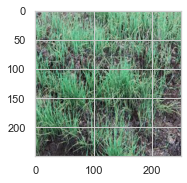

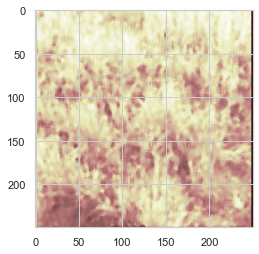

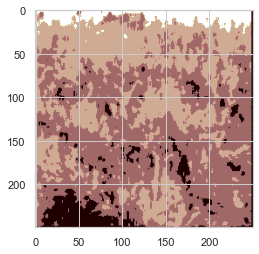

(250, 250, 3)


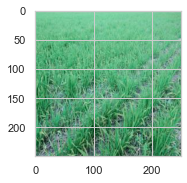

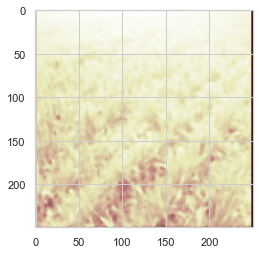

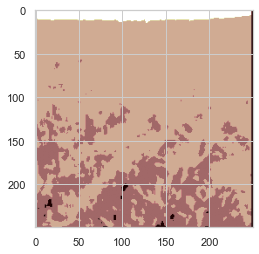

(250, 250, 3)


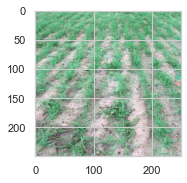

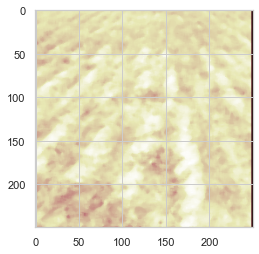

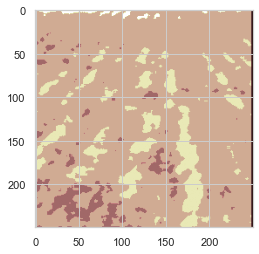

(250, 250, 3)


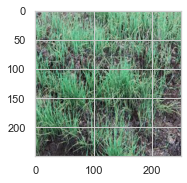

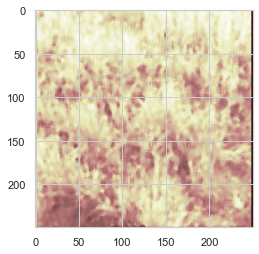

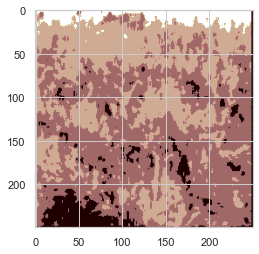

(250, 250, 3)


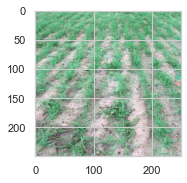

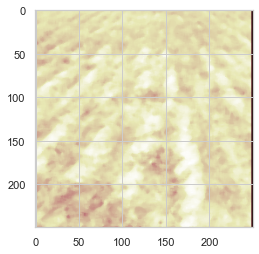

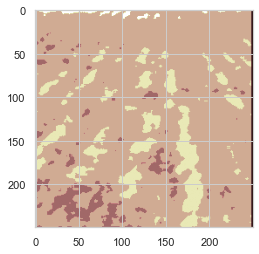

(250, 250, 3)


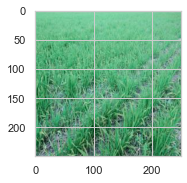

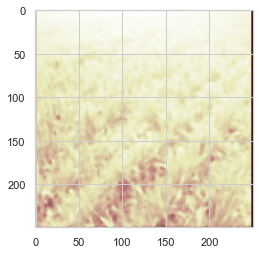

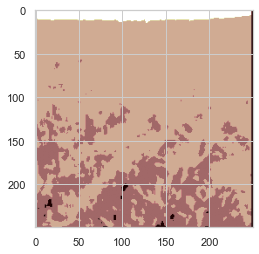

(250, 250, 3)


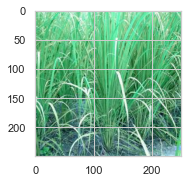

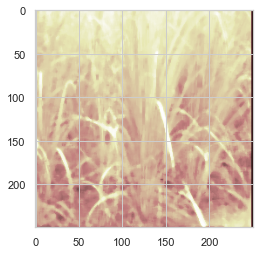

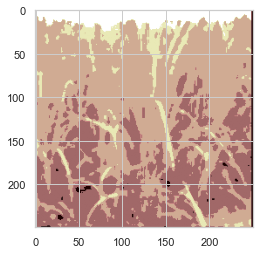

(250, 250, 3)


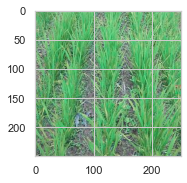

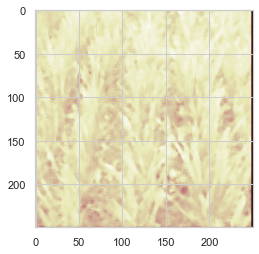

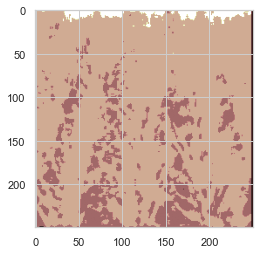

(250, 250, 3)


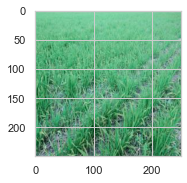

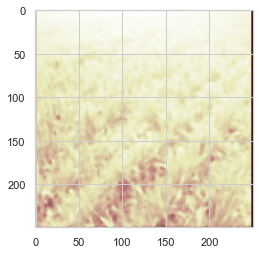

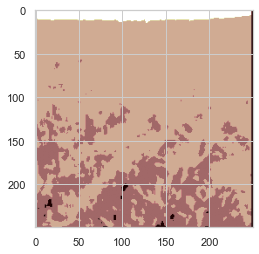

(250, 250, 3)


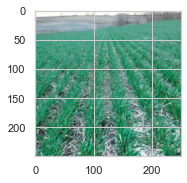

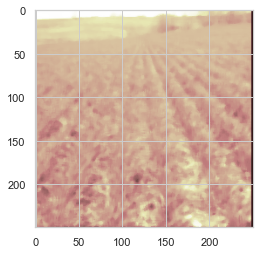

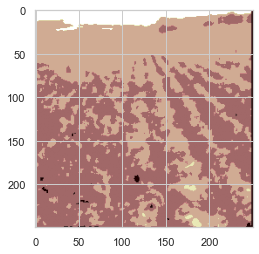

(250, 250, 3)


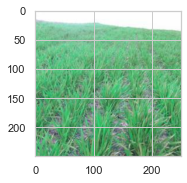

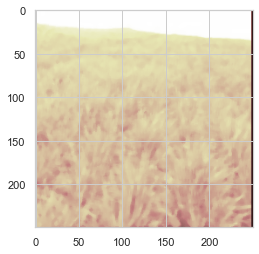

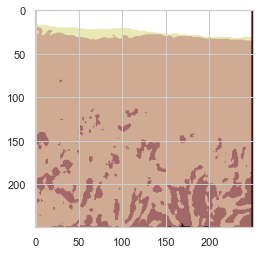

(250, 250, 3)


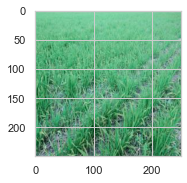

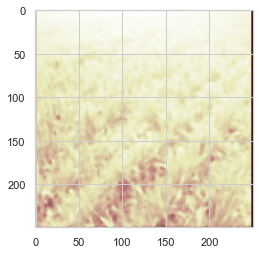

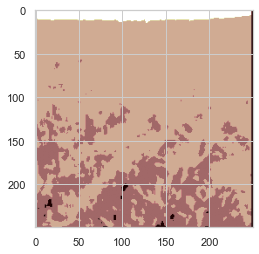

(250, 250, 3)


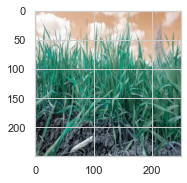

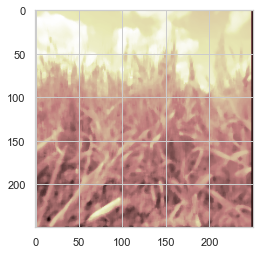

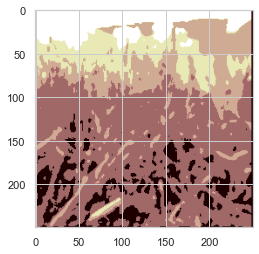

(250, 250, 3)


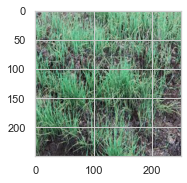

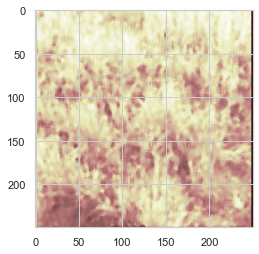

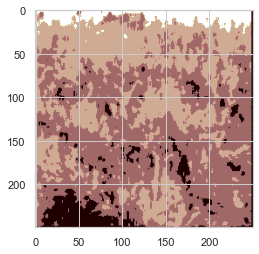

(250, 250, 3)


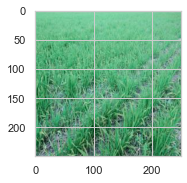

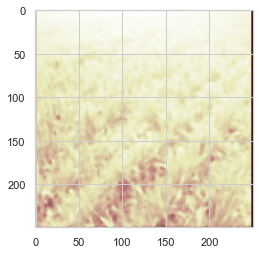

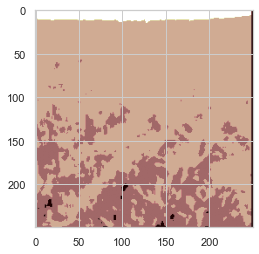

(250, 250, 3)


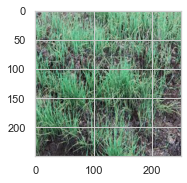

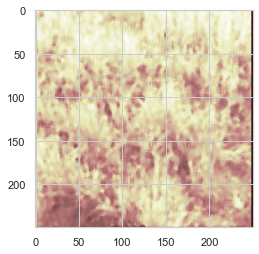

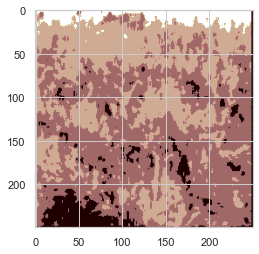

(250, 250, 3)


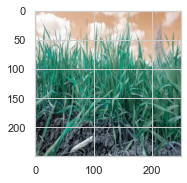

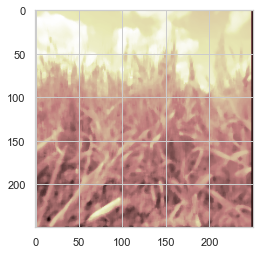

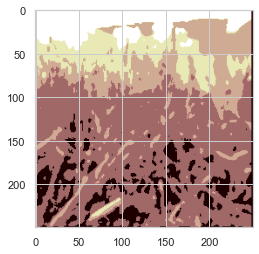

(250, 250, 3)


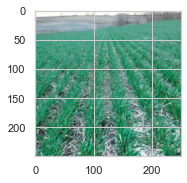

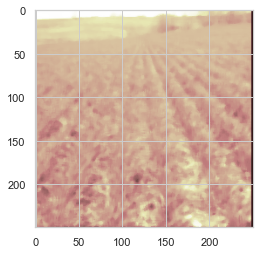

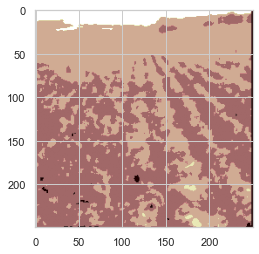

(250, 250, 3)


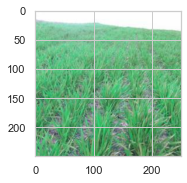

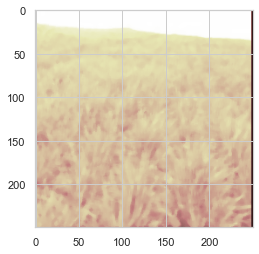

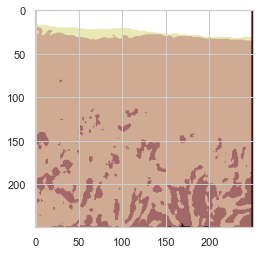

(250, 250, 3)


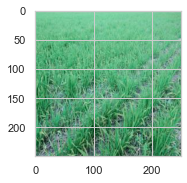

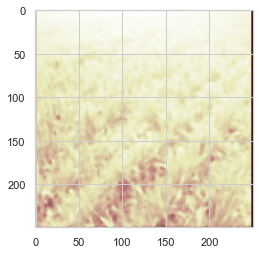

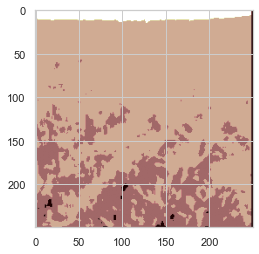

(250, 250, 3)


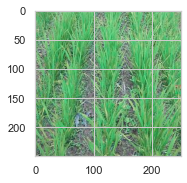

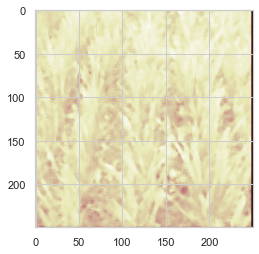

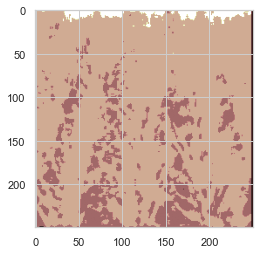

(250, 250, 3)


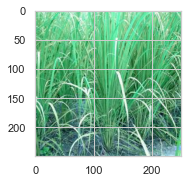

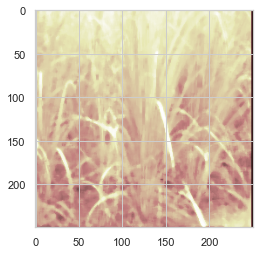

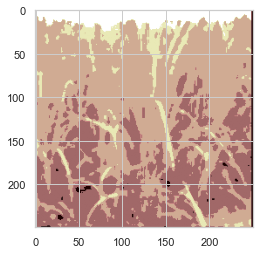

In [100]:
import scipy.ndimage
from skimage.color import rgb2gray
import numpy as np
import cv2
import matplotlib.pyplot as plt
%matplotlib inline
from scipy import ndimage
featLength = 6
testFeats = np.zeros((train.shape[0],featLength))
for i in range(len(train)):
    img = cv2.imread(train['file'][i])
    print(img.shape)
    imgs = rgb2gray(img)
    removed_noise_3 = median_filter(imgs, 5)
    fig = plt.figure(figsize = (12, 10))
    res = ExGs(removed_noise_3)
    gCoMat = greycomatrix(res.astype(int), [2], [0],256,symmetric=True, normed=True)
    contrast = greycoprops(gCoMat, prop='contrast')
    dissimilarity = greycoprops(gCoMat, prop='dissimilarity')
    homogeneity = greycoprops(gCoMat, prop='homogeneity')    
    energy = greycoprops(gCoMat, prop='energy')
    correlation = greycoprops(gCoMat, prop='correlation')   
    ASM = greycoprops(gCoMat, prop='ASM')  
    feat_glcm = np.array([contrast[0][0],dissimilarity[0][0],homogeneity[0][0],energy[0][0],correlation[0][0],ASM[0][0]]) 
    testFeats[i,:] = feat_glcm
    display = [img,removed_noise_3,res]
    for i in range(len(display)):
        fig.add_subplot(1, 4, i+1)
        plt.imshow(display[i],cmap="pink")
        plt.show()


In [101]:
dataset=pd.DataFrame(testFeats,columns=['Contrast','dissimilarity','homogeneity','energy','correlation','ASM'])
dataset.to_csv("featuresss.csv")
dataset.head(49)

,Contrast,dissimilarity,homogeneity,energy,correlation,ASM
0,0.420984,0.280984,0.873351,0.520563,0.717844,0.270986
1,0.356097,0.230516,0.897198,0.564088,0.778362,0.318196
2,0.423242,0.281565,0.873235,0.510099,0.744858,0.260201
3,0.397613,0.264806,0.880766,0.523950,0.755929,0.274524
4,0.397613,0.264806,0.880766,0.523950,0.755929,0.274524
5,0.343710,0.278258,0.867375,0.444094,0.821973,0.197219
6,0.346855,0.266887,0.874464,0.506121,0.733931,0.256158
7,0.300355,0.262032,0.872780,0.537416,0.772172,0.288816
8,0.401016,0.292371,0.864643,0.445604,0.785704,0.198563
9,0.148710,0.137516,0.932284,0.506657,0.926412,0.256702


In [102]:
labelss=train['species_num']

In [103]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(dataset, labelss, test_size=0.50, random_state=10)

In [104]:
def calculate_sensitivity_specificity(y_test, y_pred):
    actual_pos = y_test == 1
    actual_neg = y_test == 0
    true_pos = (y_pred == 1) & (actual_pos)
    false_pos = (y_pred == 1) & (actual_neg)
    true_neg = (y_pred == 0) & (actual_neg)
    false_neg = (y_pred == 0) & (actual_pos)
    accuracy = np.mean(y_pred == y_test)
    sensitivity = np.sum(true_pos) / np.sum(actual_pos)
    specificity = np.sum(true_neg) / np.sum(actual_neg)
    return sensitivity, specificity, accuracy

## AdaBoost

In [105]:
from sklearn.ensemble import AdaBoostClassifier
from sklearn import datasets, metrics
import joblib
import pickle
import time

ADABOOST_start= time.time()
clf = AdaBoostClassifier(n_estimators=100,learning_rate=0.0001, random_state=10)
clf.fit(X_train, y_train)
y_pred =clf.predict(X_test)
metrics.accuracy_score(y_test, y_pred)
sensitivity1, specificity1, accuracy1=calculate_sensitivity_specificity(y_test, y_pred)
time=time.time()
print ('Sensitivity:', sensitivity1)
print ('Specificity:', specificity1)
print ('Accuracy:', accuracy1)
print ('Time Taking By AdaBoost:', {time - ADABOOST_start})

Sensitivity: 0.8461538461538461
Specificity: 1.0
Accuracy: 0.9166666666666666
Time Taking By AdaBoost: {0.3480656147003174}


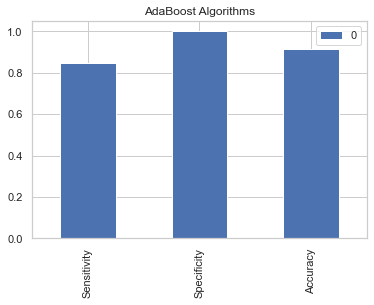

In [106]:
import matplotlib.pyplot as plot
import warnings
warnings.filterwarnings("ignore")
sns.set(style="white")
sns.set(style="whitegrid", color_codes=True)
l=[sensitivity1, specificity1, accuracy1]
datas=pd.DataFrame(l,index=['Sensitivity','Specificity','Accuracy'])
datas.plot.bar()
plot.title('AdaBoost Algorithms')
plot.show(block=True)

## PNN

In [110]:
from sklearn import datasets
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import scale

def input_data():
    data=pd.read_csv('featuresss.csv')
    data=data.drop(['Unnamed: 0'],axis=1)
    x = data
    y = labelss[:47]
    x = scale(x)
    x_train, x_test, y_train, y_test = train_test_split(x, y, test_size = 0.70, random_state = 14)

    data = {'x_train': x_train,'x_test': x_test,'y_train': y_train,'y_test': y_test}

    return data

In [111]:
import numpy as np
from neupy import algorithms
from sklearn.metrics import accuracy_score,confusion_matrix,precision_score,recall_score
import time
def rbf(centre, x, sigma):
    centre = centre.reshape(1, -1)
    temp = -np.sum((centre - x) ** 2, axis = 1)
    temp = temp / (2 * sigma * sigma)
    temp = np.exp(temp)
    gaussian = np.sum(temp)
    return gaussian
def subset_by_class(data, labels):

    x_train_subsets = []
    
    for l in labels:
        indices = np.where(data['y_train'] == l)
        x_train_subsets.append(data['x_train'][indices, :])

    return x_train_subsets


def PNN(data):

    num_testset = data['x_test'].shape[0]
    labels = np.unique(data['y_train'])
    num_class = len(labels)
    sigma = 10
    x_train_subsets = subset_by_class(data, labels)
    summation_layer = np.zeros(num_class)
    predictions = np.zeros(num_testset)
    for i, test_point in enumerate(data['x_test']):

        for j, subset in enumerate(x_train_subsets):
            summation_layer[j] = np.sum(
            rbf(test_point, subset[0], sigma)) / subset[0].shape[0] 
        predictions[i] = np.argmax(summation_layer)

    return predictions


def print_metrics(y_test, predictions):
    
    print('Accuracy: {}'.format(accuracy_score(y_test, predictions)))
    print('Sensitivity: {}'.format(precision_score(y_test, predictions, average = 'macro')))
    print('Specificity: {}'.format(recall_score(y_test, predictions, average = 'macro')))
    
def caculate_measure(y_test, predictions):
    Accuracy = accuracy_score(y_test, predictions)
    Sensitivity = precision_score(y_test, predictions, average = 'macro')
    Specificity = recall_score(y_test, predictions, average = 'macro')
    
    return Accuracy,Sensitivity,Specificity
    
    
if __name__ == '__main__':
    start= time.time()
    data = input_data()
    
    predictions = PNN(data)
    pnn = algorithms.PNN(std=10, verbose=False)
    pnn.train(X_train, y_train)
    print_metrics(data['y_test'], predictions)
    
    Accuracy,Sensitivity,Specificity = caculate_measure(data['y_test'], predictions)
    time=time.time()
    print ('Time Taking By PNN:', {time - start})

Accuracy: 0.8484848484848485
Sensitivity: 0.8863636363636364
Specificity: 0.84375
Time Taking By PNN: {0.030916690826416016}


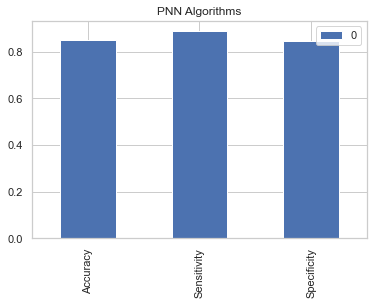

In [91]:
import matplotlib.pyplot as plot
import warnings
warnings.filterwarnings("ignore")
sns.set(style="white")
sns.set(style="whitegrid", color_codes=True)
l=[Accuracy,Sensitivity,Specificity]
datas=pd.DataFrame(l,index=['Accuracy','Sensitivity','Specificity'])
datas.plot.bar()
plot.title('PNN Algorithms')
plot.show(block=True)

In [81]:
resize(r"C:\Users\hp\Documents\8th sem\PP1\Project Folder\Dataset\Images")

In [82]:
test_dir = r'C:\Users\hp\Documents\8th sem\PP1\Project Folder\Dataset'
labels= ['images']
for sp in labels:
    print('{} {} images'.format(sp, len(os.listdir(os.path.join(test_dir, sp)))))
test = []
for species_num, sp in enumerate(labels):
    for file in os.listdir(os.path.join(test_dir, sp)):
        test.append([r'C:\Users\hp\Documents\8th sem\PP1\Project Folder\Dataset//{}//{}'.format(sp, file)])
test = pd.DataFrame(test, columns=['file'])
print('Test Data: ',test.shape)

images 8 images
Test Data:  (8, 1)


(250, 250, 3)
C:\Users\hp\Documents\8th sem\PP1\Project Folder\Dataset//images//10.jpg


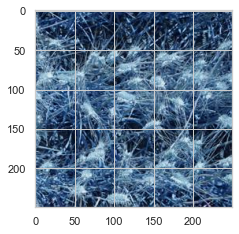

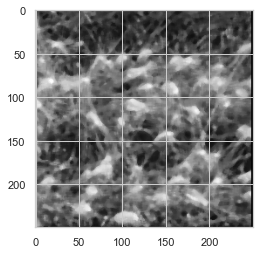

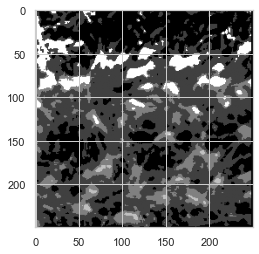

(250, 250, 3)
C:\Users\hp\Documents\8th sem\PP1\Project Folder\Dataset//images//11.jpg


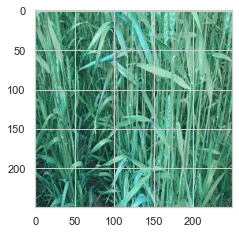

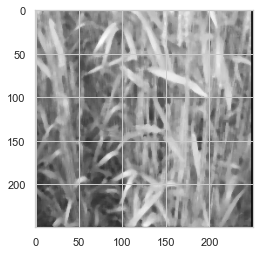

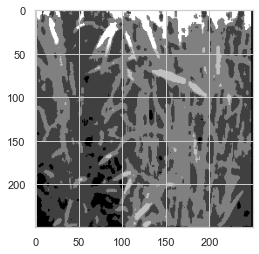

(250, 250, 3)
C:\Users\hp\Documents\8th sem\PP1\Project Folder\Dataset//images//2.jpg


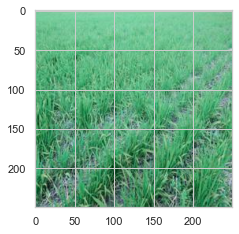

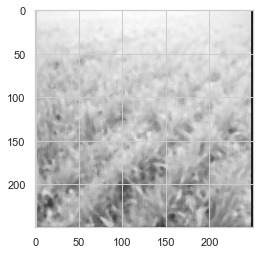

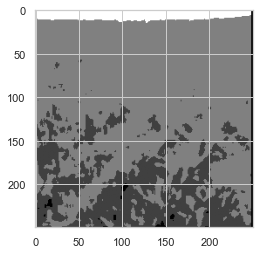

(250, 250, 3)
C:\Users\hp\Documents\8th sem\PP1\Project Folder\Dataset//images//23.jpg


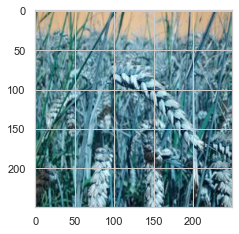

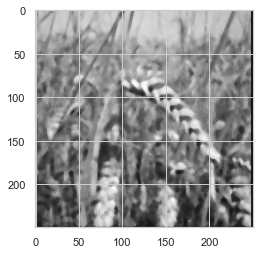

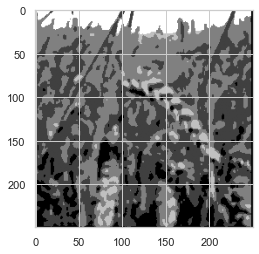

(250, 250, 3)
C:\Users\hp\Documents\8th sem\PP1\Project Folder\Dataset//images//4.jpg


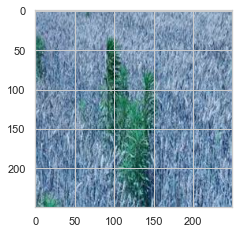

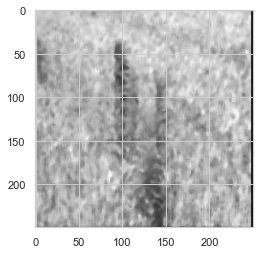

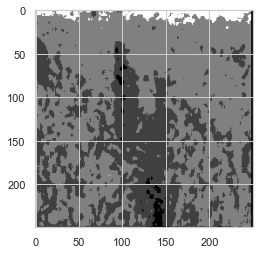

(250, 250, 3)
C:\Users\hp\Documents\8th sem\PP1\Project Folder\Dataset//images//9130010.jpg


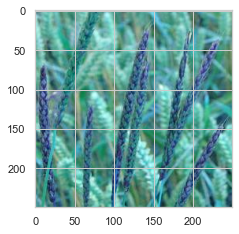

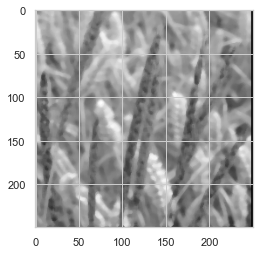

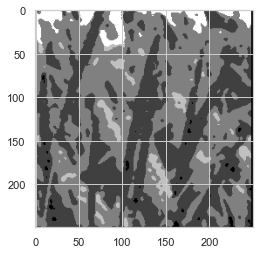

(250, 250, 3)
C:\Users\hp\Documents\8th sem\PP1\Project Folder\Dataset//images//Blackgrass-original-standard.jpg


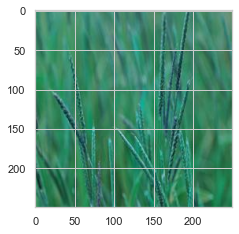

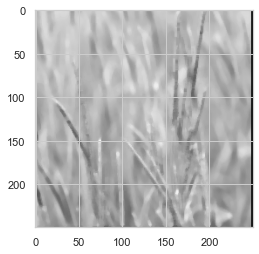

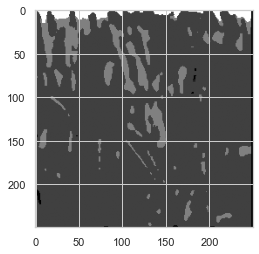

(250, 250, 3)
C:\Users\hp\Documents\8th sem\PP1\Project Folder\Dataset//images//young-unripe-wheat-close-up-uk-B1NRF7.jpg


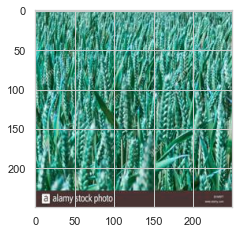

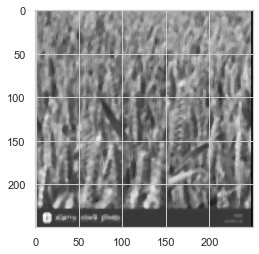

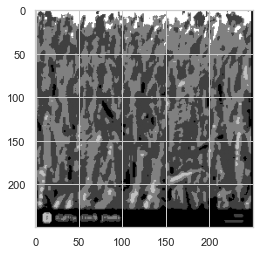

In [83]:
featLength = 6
testFeats = np.zeros((test.shape[0],featLength))
for i in range(len(test)):
    img = cv2.imread(test['file'][i])
    print(img.shape)
    imgs = rgb2gray(img)
    removed_noise_3 = median_filter(imgs, 5)
    fig = plt.figure(figsize = (12, 10))
    res = ExGs(removed_noise_3)
    gCoMat = greycomatrix(res.astype(int), [2], [0],256,symmetric=True, normed=True)
    contrast = greycoprops(gCoMat, prop='contrast')
    dissimilarity = greycoprops(gCoMat, prop='dissimilarity')
    homogeneity = greycoprops(gCoMat, prop='homogeneity')    
    energy = greycoprops(gCoMat, prop='energy')
    correlation = greycoprops(gCoMat, prop='correlation')   
    ASM = greycoprops(gCoMat, prop='ASM')  
    feat_glcm = np.array([contrast[0][0],dissimilarity[0][0],homogeneity[0][0],energy[0][0],correlation[0][0],ASM[0][0]]) 
    testFeats[i,:] = feat_glcm
    print(test['file'][i])
    display = [img,removed_noise_3,res]
    for i in range(len(display)):
        fig.add_subplot(1, 3, i+1)
        plt.imshow(display[i],cmap="gray")
        plt.show()


In [84]:
#ADABOOST
y_pred =clf.predict(testFeats)

In [85]:
for i in y_pred:
    if i==0:
        print('wheat')
    else:
        print('weed')

wheat
wheat
weed
wheat
weed
weed
weed
wheat


In [86]:
#PNN
y_predicted = pnn.predict(testFeats)

In [87]:
for i in y_predicted:
    if i==0:
        print('wheat')
    else:
        print('weed')

wheat
wheat
weed
wheat
weed
wheat
weed
wheat
